In [81]:
# Librerias
!pip install gdown
!pip install matplotlib seaborn

In [82]:
import gdown
import pandas as pd

# URL del archivo en Google Drive
file_id = '1ncCoyFiMpp1uXSrx8UEv5MhLJ6ej02ln'
url = f'https://drive.google.com/uc?id={file_id}'

# Descargar el archivo
gdown.download(url, 'REGISTRO_DATOS.csv', quiet=False)

# Cargar el archivo CSV en un DataFrame
df = pd.read_csv('REGISTRO_DATOS.csv', delimiter=',')

# Mostrar las primeras filas del DataFrame
print(df.head())

Downloading...
From: https://drive.google.com/uc?id=1ncCoyFiMpp1uXSrx8UEv5MhLJ6ej02ln
To: C:\Users\User1\REGISTRO_DATOS.csv
100%|██████████| 2.56M/2.56M [00:00<00:00, 3.94MB/s]

   Unnamed: 0   id                             department  timecreated  \
0      121884  552   Departamento De Español y Literatura   1709549942   
1      121885  319  Departamento De Informática Educativa   1709551598   
2      121886  568          Departamento de Salud Pública   1709551692   
3      121887   29                                    NaN   1709555966   
4      121888  366             Dpto De Ciencias Naturales   1709556334   

              rol                                             userid  
0  editingteacher  fa5d171c9280388b26a2569e9fccc7683ab3ec70b685b3...  
1  editingteacher  6620b5d17f18eed1eb4d2d1cf4d7fe20c1dc49f0d6605d...  
2  editingteacher  eca7bf3a91ac9f5b18f1bc05d3c44326c4a70f9d746a1b...  
3  editingteacher  d6fccd5d02351b1c921506167eb6bd49e8203158ddd342...  
4  editingteacher  9a94168caabfa08ab2e00e84ccae436d30338af9eedc28...  


In [83]:
df

,Unnamed: 0,id,department,timecreated,rol,userid
0,121884,552,Departamento De Español y Literatura,1709549942,editingteacher,fa5d171c9280388b26a2569e9fccc7683ab3ec70b685b3...
1,121885,319,Departamento De Informática Educativa,1709551598,editingteacher,6620b5d17f18eed1eb4d2d1cf4d7fe20c1dc49f0d6605d...
2,121886,568,Departamento de Salud Pública,1709551692,editingteacher,eca7bf3a91ac9f5b18f1bc05d3c44326c4a70f9d746a1b...
3,121887,29,NaN,1709555966,editingteacher,d6fccd5d02351b1c921506167eb6bd49e8203158ddd342...
4,121888,366,Dpto De Ciencias Naturales,1709556334,editingteacher,9a94168caabfa08ab2e00e84ccae436d30338af9eedc28...
...,...,...,...,...,...,...
18944,459318,16465,DEPARTAMENTO DE FISICA Y ELECTRONICA D P,1713366104,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...
18945,459321,16465,DEPARTAMENTO DE FISICA Y ELECTRONICA D P,1713367124,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...
18946,459700,16465,DEPARTAMENTO DE FISICA Y ELECTRONICA D P,1713827512,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...
18947,459956,16465,DEPARTAMENTO DE FISICA Y ELECTRONICA D P,1714218380,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...


In [84]:
# Contenido de la variable 'department', obviamente hay errores de ortografia
df['department'].unique()

array(['Departamento De Español y Literatura',
       'Departamento De Informática Educativa',
       'Departamento de Salud Pública', nan, 'Dpto De Ciencias Naturales',
       'Departamento De Ciencias Jurídicas',
       'Departamento De Ingeniería Industrial',
       'Dpto De Ing Agronómica Y Desarroll Rural',
       'Dpto Ciencias Administrativas', 'Departamento De Enfermería',
       'Departamento De Idiomas Extranjeros', 'Departamento De Química',
       'Dpto De Ing De Sistemas Y Telecomunicaci',
       'Departamento De Matemáticas Y Estadístic',
       'Departamento de Regencía Y Farmacia', 'Departamento De Biología',
       'Departamento de Psicopedagogía', 'Dpto De Ingeniería Ambiental',
       'Dpto De Cultura Física, Recreac Y Deport',
       'Departamento De Ciencias Pecuarías',
       'Departamento De Geografía Y Medio Ambien',
       'Departamento De Bacteriología',
       'Departamento de Física y Electrónica', ' Ingeniería Mecánica',
       'ENFERMERÍA', 'Departamento D

In [85]:
# 1. Clear the Department column / Limpiar la columna Departamento
# Se creo un diccionario para mapear nombres incorrectos a nombres correctos
correcciones = {
    'Departamento De Español y Literatura': 'Departamento de Español y Literatura',
    'Departamento De Informática Educativa': 'Departamento de Informática Educativa',
    'Departamento de Salud Pública': 'Departamento de Salud Pública',
    'Dpto De Ciencias Naturales': 'Departamento de Ciencias Naturales',
    'Departamento De Ciencias Jurídicas': 'Departamento de Ciencias Jurídicas',
    'Departamento De Ingeniería Industrial': 'Departamento de Ingeniería Industrial',
    'Dpto De Ing Agronómica Y Desarroll Rural': 'Departamento de Ingeniería Agronómica y Desarrollo Rural',
    'Dpto Ciencias Administrativas': 'Departamento de Ciencias Administrativas',
    'Departamento De Enfermería': 'Departamento de Enfermería',
    'Departamento De Idiomas Extranjeros': 'Departamento de Idiomas Extranjeros',
    'Departamento De Química': 'Departamento de Química',
    'Dpto De Ing De Sistemas Y Telecomunicaci': 'Departamento de Ingeniería de Sistemas y Telecomunicaciones',
    'Departamento De Matemáticas Y Estadístic': 'Departamento de Matemáticas y Estadística',
    'Departamento de Regencía Y Farmacia': 'Departamento de Regencia y Farmacia',
    'Departamento De Biología': 'Departamento de Biología',
    'Departamento de Psicopedagogía': 'Departamento de Psicopedagogía',
    'Dpto De Ingeniería Ambiental': 'Departamento de Ingeniería Ambiental',
    'Dpto De Cultura Física, Recreac Y Deport': 'Departamento de Cultura Física, Recreación y Deportes',
    'Departamento De Ciencias Pecuarías': 'Departamento de Ciencias Pecuarias',
    'Departamento De Geografía Y Medio Ambien': 'Departamento de Geografía y Medio Ambiente',
    'Departamento De Bacteriología': 'Departamento de Bacteriología',
    'Departamento de Física y Electrónica': 'Departamento de Física y Electrónica',
    ' Ingeniería Mecánica': 'Departamento de Ingeniería Mecánica',
    'ENFERMERÍA': 'Departamento de Enfermería',
    'Departamento De Ciencias Sociales': 'Departamento de Ciencias Sociales',
    'ENFERMERÍA ': 'Departamento de Enfermería',
    'Departamento de Ciencias Acuícolas': 'Departamento de Ciencias Acuícolas',
    'Lic en Informática': 'Departamento de Informática',
    'Regencia de Farmacia': 'Departamento de Regencia de Farmacia',
    'Departamento De Ingeniería de Alimentos': 'Departamento de Ingeniería de Alimentos',
    'Departamento de Ingeniería Mecánica': 'Departamento de Ingeniería Mecánica',
    'Informática': 'Departamento de Informática',
    'Ingeniería Ambiental ': 'Departamento de Ingeniería Ambiental',
    'Departamento de Psicopedagoga': 'Departamento de Psicopedagogía',
    'Departamento de Artes': 'Departamento de Artes',
    'CIENCIAS JURÍDICAS': 'Departamento de Ciencias Jurídicas',
    'INFORMÁTICA': 'Departamento de Informática',
    'Departamento De Ciencias Jurdicas': 'Departamento de Ciencias Jurídicas',
    'DEPARTAMENTO DE BACTERIOLOGIA D P': 'Departamento de Bacteriología',
    'Departamento de Salud Pblica': 'Departamento de Salud Pública',
    'DEPARTAMENTO DE ENFERMERIA D P': 'Departamento de Enfermería',
    'MATEMATICA Y ESTADISTICA': 'Departamento de Matemáticas y Estadística',
    'ADMINISTRACIÓN EN SALUD': 'Departamento de Administración en Salud',
    'GEOGRAFÍA': 'Departamento de Geografía',
    'PSICOPEDAGOGIA': 'Departamento de Psicopedagogía',
    'Ingeniería ': 'Departamento de Ingeniería',
    'DEPARTAMENTO DE IDIOMAS EXTRANJEROS D P': 'Departamento de Idiomas Extranjeros',
    'DECANATURA FACULTAD DE CIENCIAS AGRICOLAS D P': 'Decanatura de la Facultad de Ciencias Agrícolas',
    'Administración en Salud': 'Departamento de Administración en Salud',
    'Fsica': 'Departamento de Física',
    'INFORMATICA': 'Departamento de Informática',
    'Ingeniería Ambiental': 'Departamento de Ingeniería Ambiental',
    'DEPARTAMENTO DE SALUD PUBLICA D P': 'Departamento de Salud Pública',
    'DEPARTAMENTO DE CIENCIAS ACUICOLAS D P': 'Departamento de Ciencias Acuáticas',
    'Departamento De Informtica Educativa': 'Departamento de Informática Educativa',
    'Departamento De Geografa Y Medio Ambien': 'Departamento de Geografía y Medio Ambiente',
    'Dpto De Cultura Fsica, Recreac Y Deport': 'Departamento de Cultura Física, Recreación y Deportes',
    'BIOLOGIA': 'Departamento de Biología',
    'DEPARTAMENTO DE INGENIERIA AMBIENTAL D P': 'Departamento de Ingeniería Ambiental',
    'DEPARTAMENTO DE FISICA Y ELECTRONICA D P': 'Departamento de Física y Electrónica'
}

# Aplicar las correcciones al DataFrame
df['department'] = df['department'].replace(correcciones)

# Mostrar los valores únicos para confirmar la corrección
print(df['department'].unique())

# Crear un nuevo DataFrame con los departamentos corregidos
nuevo_df = df.copy()


['Departamento de Español y Literatura'
 'Departamento de Informática Educativa' 'Departamento de Salud Pública'
 nan 'Departamento de Ciencias Naturales'
 'Departamento de Ciencias Jurídicas'
 'Departamento de Ingeniería Industrial'
 'Departamento de Ingeniería Agronómica y Desarrollo Rural'
 'Departamento de Ciencias Administrativas' 'Departamento de Enfermería'
 'Departamento de Idiomas Extranjeros' 'Departamento de Química'
 'Departamento de Ingeniería de Sistemas y Telecomunicaciones'
 'Departamento de Matemáticas y Estadística'
 'Departamento de Regencia y Farmacia' 'Departamento de Biología'
 'Departamento de Psicopedagogía' 'Departamento de Ingeniería Ambiental'
 'Departamento de Cultura Física, Recreación y Deportes'
 'Departamento de Ciencias Pecuarias'
 'Departamento de Geografía y Medio Ambiente'
 'Departamento de Bacteriología' 'Departamento de Física y Electrónica'
 'Departamento de Ingeniería Mecánica' 'Departamento de Ciencias Sociales'
 'Departamento de Ciencias Acuíco

In [86]:
# Nuevo dataframe con 'department' Correjido
nuevo_df

,Unnamed: 0,id,department,timecreated,rol,userid
0,121884,552,Departamento de Español y Literatura,1709549942,editingteacher,fa5d171c9280388b26a2569e9fccc7683ab3ec70b685b3...
1,121885,319,Departamento de Informática Educativa,1709551598,editingteacher,6620b5d17f18eed1eb4d2d1cf4d7fe20c1dc49f0d6605d...
2,121886,568,Departamento de Salud Pública,1709551692,editingteacher,eca7bf3a91ac9f5b18f1bc05d3c44326c4a70f9d746a1b...
3,121887,29,NaN,1709555966,editingteacher,d6fccd5d02351b1c921506167eb6bd49e8203158ddd342...
4,121888,366,Departamento de Ciencias Naturales,1709556334,editingteacher,9a94168caabfa08ab2e00e84ccae436d30338af9eedc28...
...,...,...,...,...,...,...
18944,459318,16465,Departamento de Física y Electrónica,1713366104,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...
18945,459321,16465,Departamento de Física y Electrónica,1713367124,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...
18946,459700,16465,Departamento de Física y Electrónica,1713827512,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...
18947,459956,16465,Departamento de Física y Electrónica,1714218380,editingteacher,1ba19ebd2a8fa609b7beb085d0b7f30f0e262859b475f8...


Total de Inicios de Sesión por Departamento:
Departamento de Salud Pública: 2920
Departamento de Ciencias Administrativas: 1983
Departamento de Informática Educativa: 1624
Departamento de Ingeniería de Sistemas y Telecomunicaciones: 1147
Departamento de Psicopedagogía: 958
Departamento de Ingeniería Industrial: 811
Departamento de Biología: 725
Departamento de Idiomas Extranjeros: 715
Departamento de Matemáticas y Estadística: 702
Departamento de Bacteriología: 668
Departamento de Ingeniería Ambiental: 620
Departamento de Geografía y Medio Ambiente: 590
Departamento de Química: 583
Departamento de Ingeniería de Alimentos: 513
Departamento de Ingeniería Mecánica: 475
Departamento de Física y Electrónica: 374
Departamento de Enfermería: 335
Departamento de Ciencias Jurídicas: 326
Departamento de Ingeniería Agronómica y Desarrollo Rural: 312
Departamento de Ciencias Naturales: 211
Departamento de Informática: 198
Departamento de Ciencias Pecuarias: 189
Departamento de Cultura Física, Recr

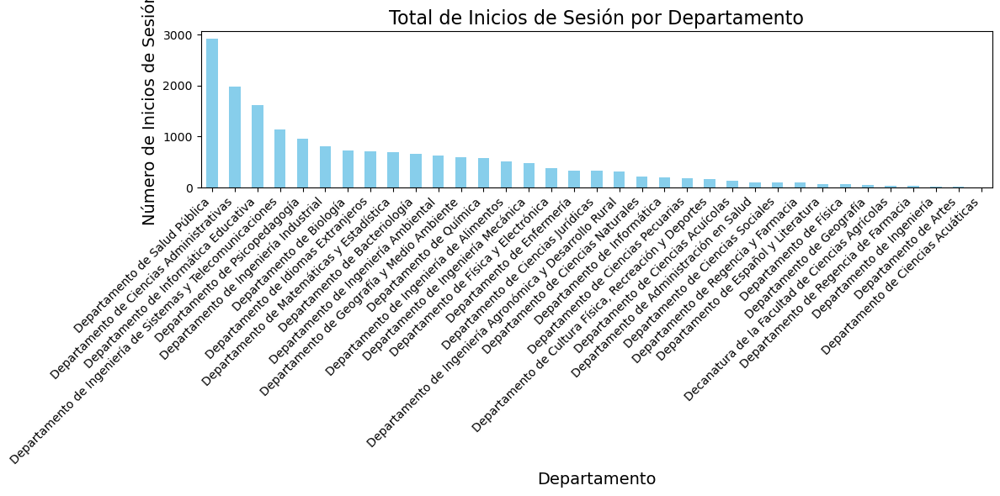

In [87]:
# 2. Show total login by department and bar graph / Mostrar el total de inicios de sesión por departamento y gráfico de barras
import matplotlib.pyplot as plt

# Contar el total de inicios de sesión por departamento
inicios_sesion_por_departamento = df['department'].value_counts()

# Mostrar los resultados en forma de lista
print("Total de Inicios de Sesión por Departamento:")
for departamento, total in inicios_sesion_por_departamento.items():
    print(f"{departamento}: {total}")

# Crear un gráfico de barras
plt.figure(figsize=(12, 6))  # Ajusta el tamaño de la figura
inicios_sesion_por_departamento.plot(kind='bar', color='skyblue')

# Añadir títulos y etiquetas
plt.title('Total de Inicios de Sesión por Departamento', fontsize=16)
plt.xlabel('Departamento', fontsize=14)
plt.ylabel('Número de Inicios de Sesión', fontsize=14)
plt.xticks(rotation=45, ha='right')  # Rotar las etiquetas del eje x para mejor legibilidad

# Mostrar el gráfico
plt.tight_layout()  # Ajustar el layout para evitar superposiciones
plt.show()



In [88]:
# 3. Display the total number of logins per teacher in a specific program / 
# Mostrar el número total de inicios de sesión por profesor en un programa específico
# Crear un DataFrame vacío para almacenar los resultados
resultados_totales = pd.DataFrame()

# Obtener la lista de departamentos únicos
departamentos_unicos = nuevo_df['department'].unique()

# Iterar sobre cada departamento
for departamento in departamentos_unicos:
    # Filtrar el nuevo DataFrame por el departamento actual
    df_departamento = nuevo_df[nuevo_df['department'] == departamento]
    
    # Agrupar por 'userid' y contar el número de inicios de sesión
    inicios_sesion_por_docente = df_departamento.groupby('userid').size().reset_index(name='total_inicios_sesion')
    
    # Añadir el departamento como una nueva columna
    inicios_sesion_por_docente['department'] = departamento
    
    # Concatenar los resultados al DataFrame total
    resultados_totales = pd.concat([resultados_totales, inicios_sesion_por_docente], ignore_index=True)

# Mostrar los resultados totales
print(resultados_totales)



                                                userid  total_inicios_sesion  \
0    21ad121f568fae92e2584da468fb6171bf6e9c9b3bc60d...                     6   
1    4f04556e743fa619a9a62367e1490a21bc3def683610b0...                     7   
2    63048871145b9c0412a90023f05858e375e7d770af6174...                     3   
3    b43b6e3f02f385b2b1fac1bb1ac29f299d5ff32b503982...                     5   
4    f7024c81b7009ba82ebd1ee9a02cee34a5f0afd3e8c118...                     1   
..                                                 ...                   ...   
505  68a75a89fe744832b7cf22f6cf30bf05f11331a2933c34...                    19   
506  c49d21fc4ea12bd51c426d61b6abeac46122d88cf504e8...                     1   
507  ec77faa4de66380b4d6265dc6615b89e2f0a494d106b87...                    36   
508  1b60c5e18937fcc0fa111a0ee8d1a022c6a6628a9c3d66...                    59   
509  9220ce3692a59f2d55f81e1893901fdeff857612401ff3...                     1   

                                       

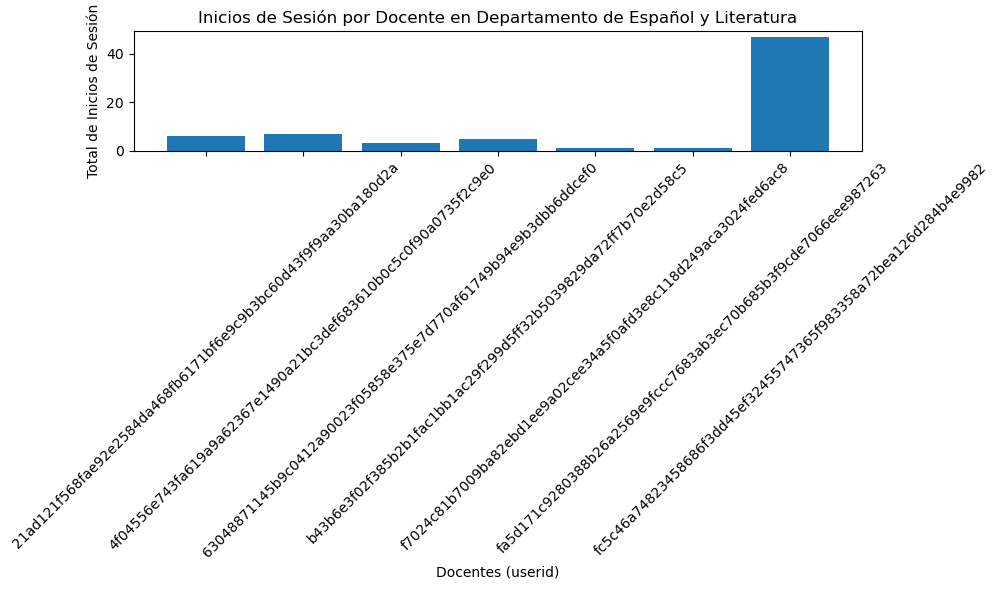

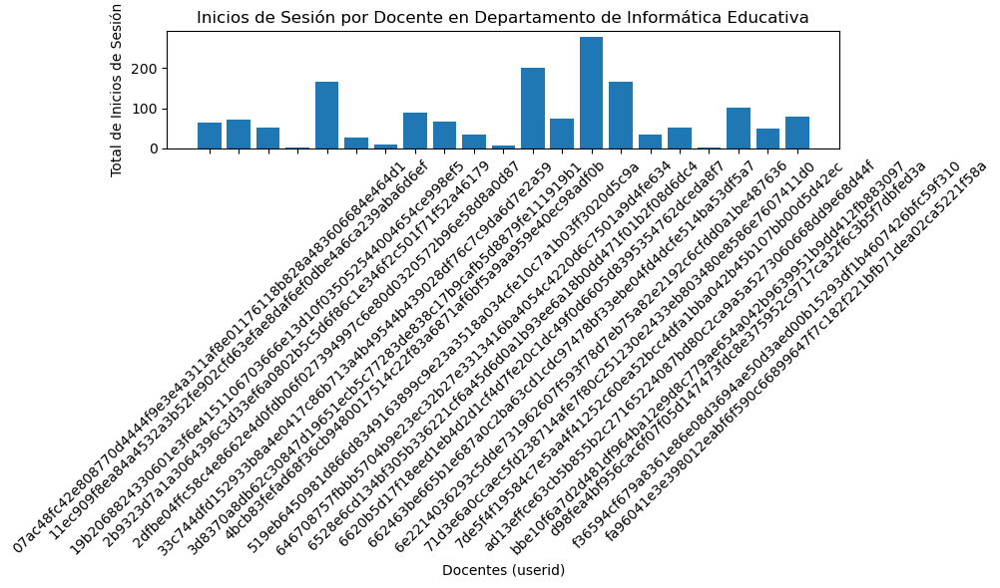

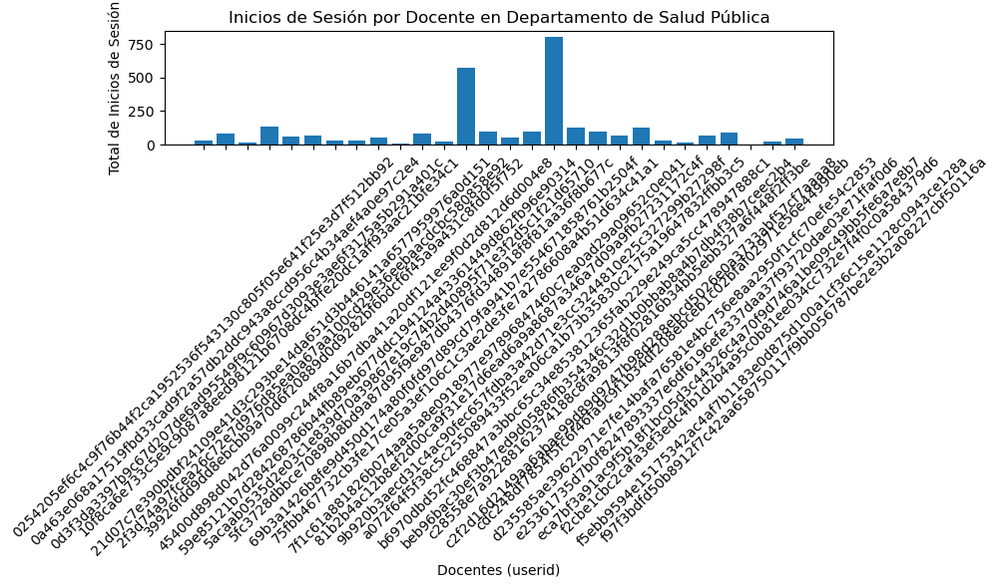

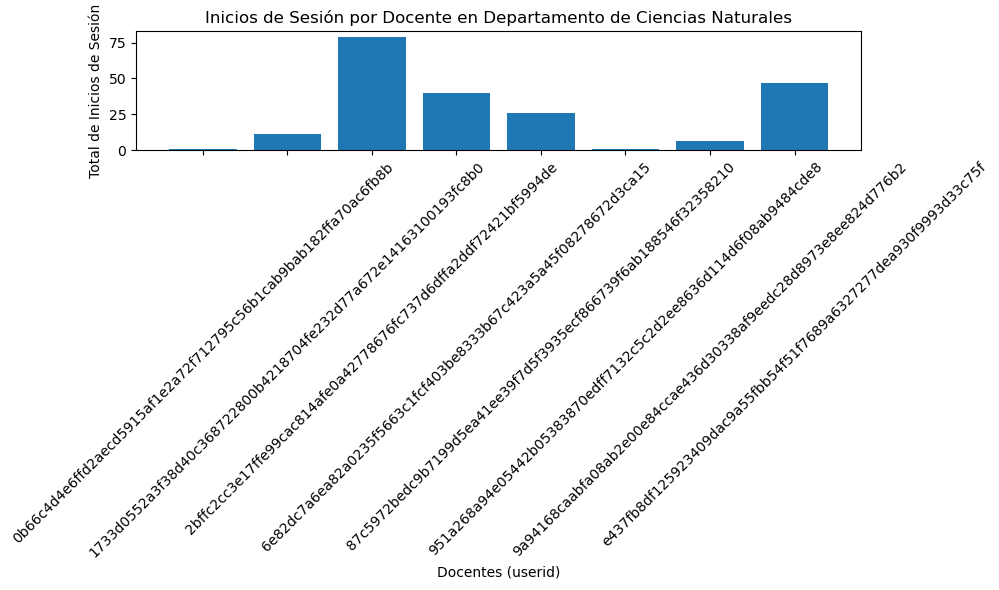

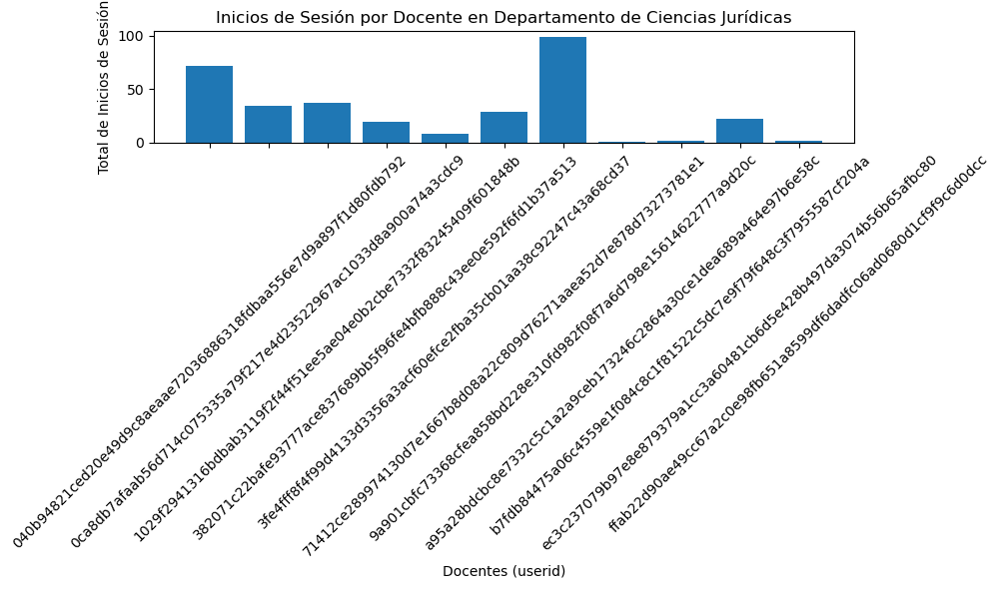

...

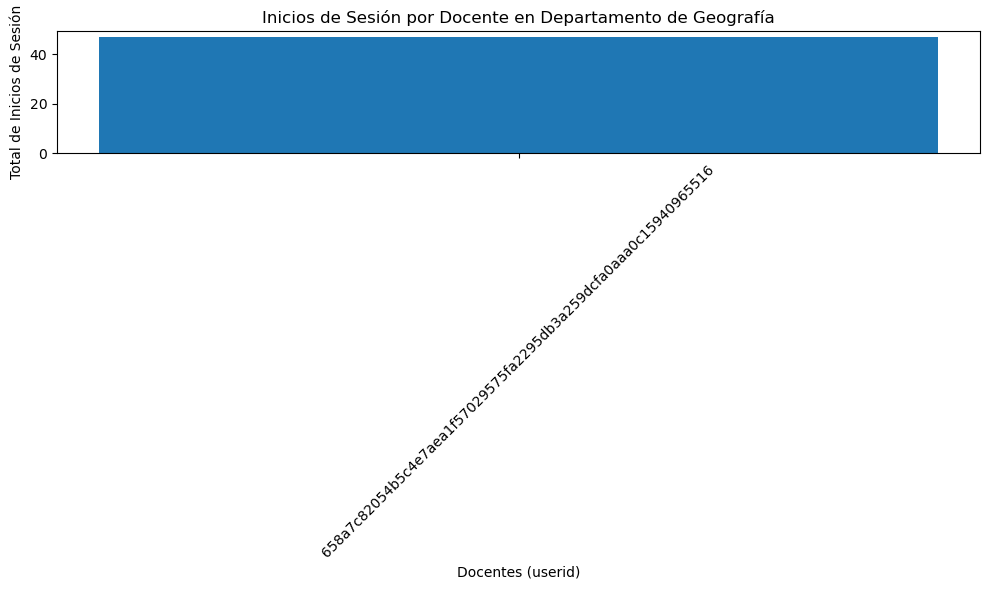

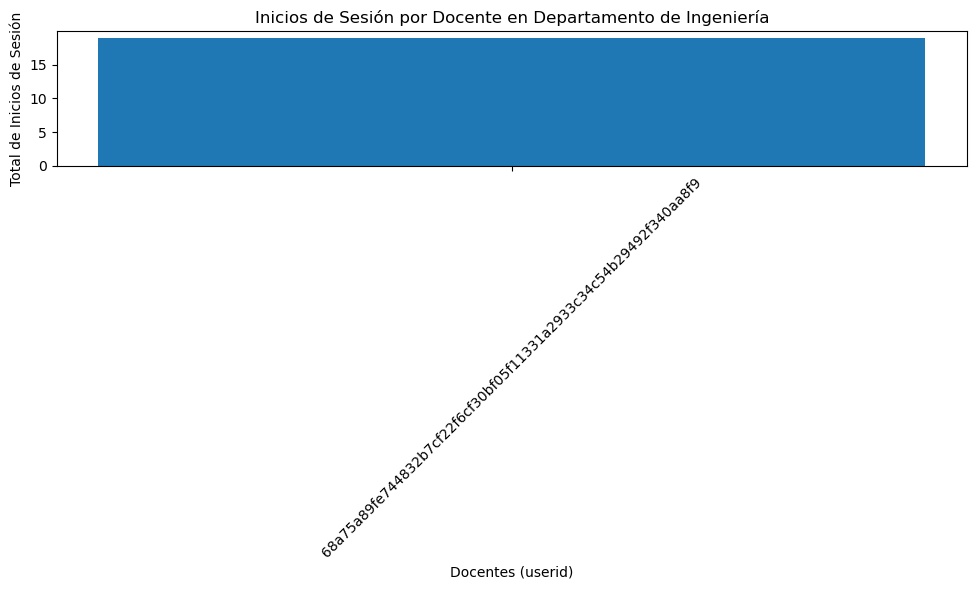

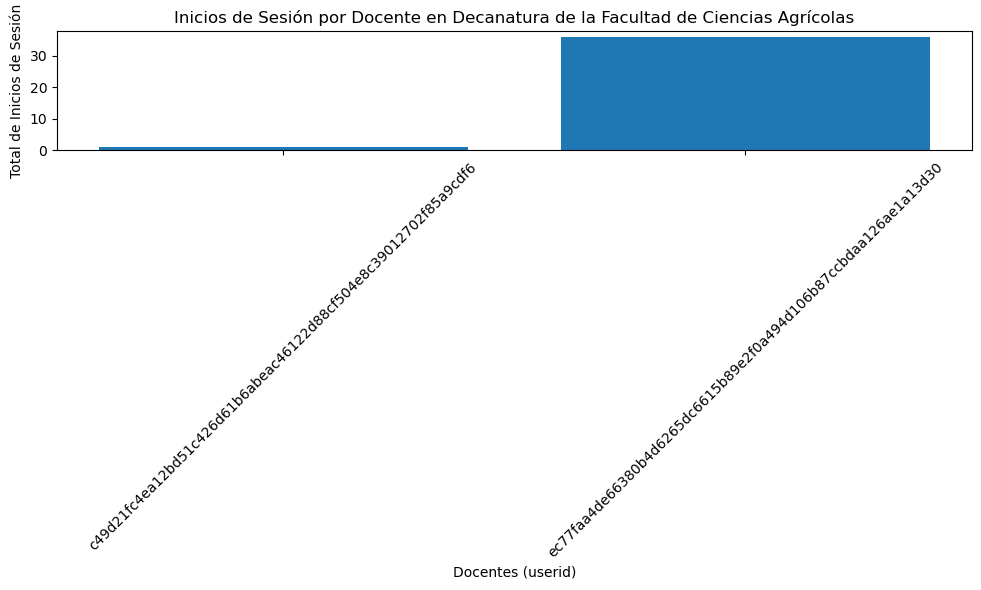

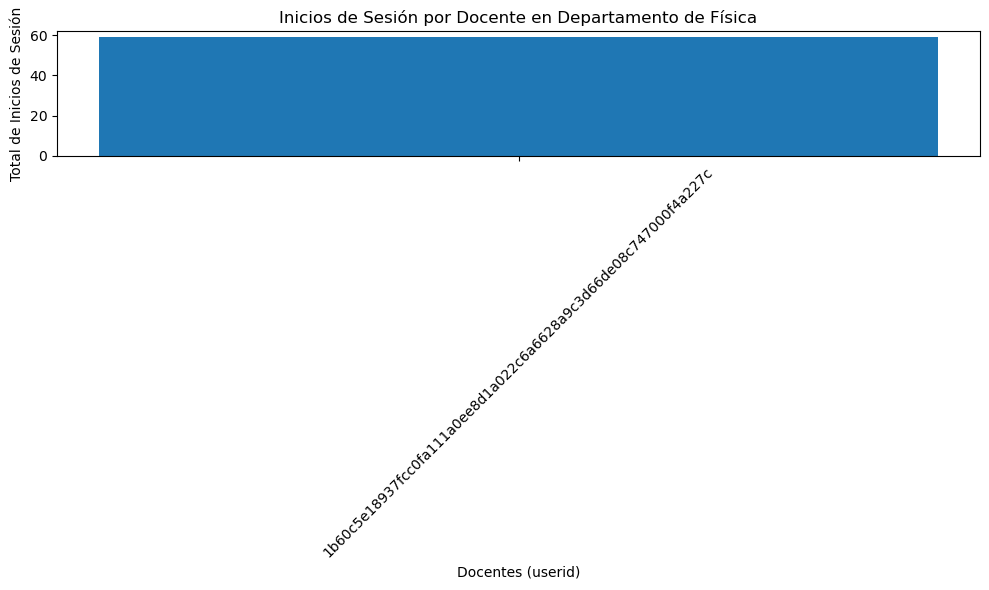

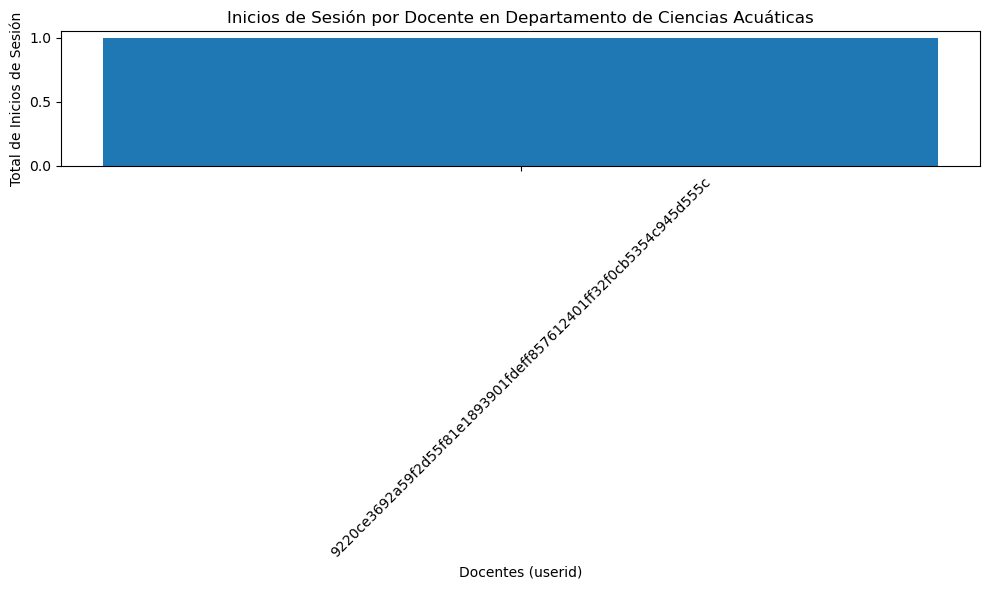

In [89]:
import matplotlib.pyplot as plt

# Crear gráfico de barras para cada departamento
departamentos_unicos = resultados_totales['department'].unique()

# Iterar sobre cada departamento y graficar
for departamento in departamentos_unicos:
    # Filtrar los resultados para el departamento actual
    df_departamento = resultados_totales[resultados_totales['department'] == departamento]
    
    # Crear gráfico de barras
    plt.figure(figsize=(10, 6))
    plt.bar(df_departamento['userid'], df_departamento['total_inicios_sesion'])
    plt.xlabel('Docentes (userid)')
    plt.ylabel('Total de Inicios de Sesión')
    plt.title(f'Inicios de Sesión por Docente en {departamento}')
    plt.xticks(rotation=45)  # Rotar etiquetas del eje x si es necesario
    plt.tight_layout()  # Ajustar diseño para evitar recortes
    plt.show()



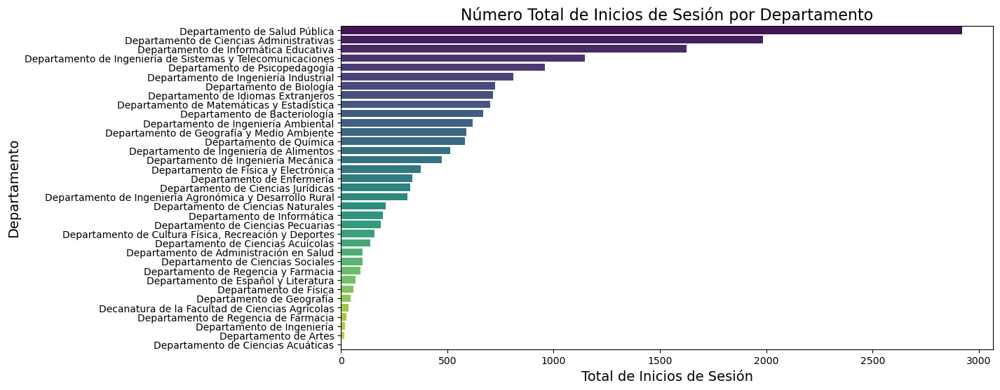

In [90]:
# 4. Login bar graph by department / Gráfico de barras de inicio de sesión por departamento
import matplotlib.pyplot as plt
import seaborn as sns

# Agrupar por 'department' y contar el número de inicios de sesión
inicios_sesion_por_departamento = nuevo_df.groupby('department').size().reset_index(name='total_inicios_sesion')

# Ordenar el DataFrame por total de inicios de sesión
inicios_sesion_por_departamento = inicios_sesion_por_departamento.sort_values(by='total_inicios_sesion', ascending=False)

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))  # Ajustar el tamaño del gráfico
sns.barplot(data=inicios_sesion_por_departamento, x='total_inicios_sesion', y='department', hue='department', palette='viridis', legend=False)

# Añadir títulos y etiquetas
plt.title('Número Total de Inicios de Sesión por Departamento', fontsize=16)
plt.xlabel('Total de Inicios de Sesión', fontsize=14)
plt.ylabel('Departamento', fontsize=14)

# Mostrar el gráfico
plt.show()

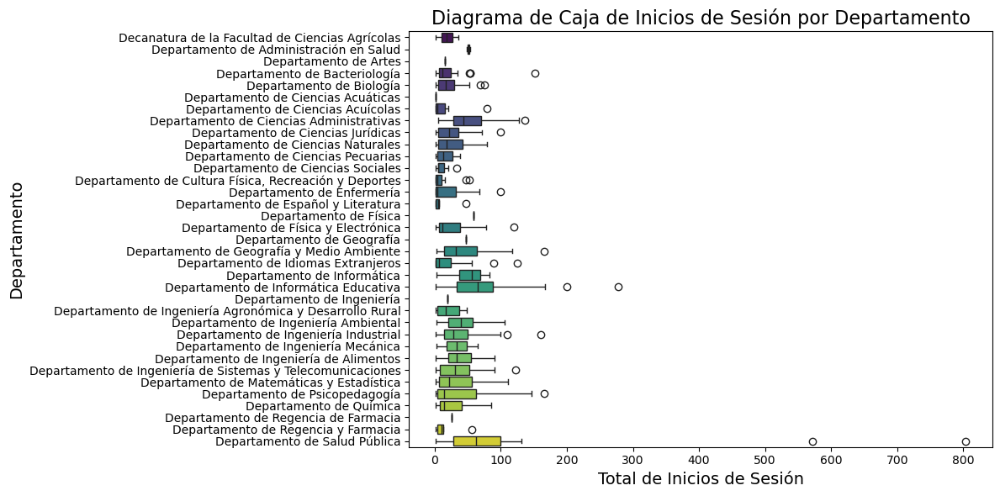

In [91]:
# 5. Login boxplot graph by department / Gráfico de diagrama de caja de inicio de sesión por departamento
import matplotlib.pyplot as plt
import seaborn as sns

# Asegúrate de que 'nuevo_df' tenga los inicios de sesión individuales.
# Supongamos que 'timecreated' representa cada inicio de sesión.
nuevo_df['inicios'] = 1  # Crear una columna que cuente cada inicio de sesión

# Agrupar por 'department' y 'userid' para contar inicios de sesión
inicios_por_docente = nuevo_df.groupby(['department', 'userid']).size().reset_index(name='total_inicios_sesion')

# Crear el diagrama de caja
plt.figure(figsize=(12, 6))  # Ajustar el tamaño del gráfico
sns.boxplot(data=inicios_por_docente, x='total_inicios_sesion', y='department', hue='department', palette='viridis', legend=False)

# Añadir títulos y etiquetas
plt.title('Diagrama de Caja de Inicios de Sesión por Departamento', fontsize=16)
plt.xlabel('Total de Inicios de Sesión', fontsize=14)
plt.ylabel('Departamento', fontsize=14)

plt.tight_layout()  # Ajustar el layout
plt.show()

In [92]:
# 6. Login average by department / Promedio de inicio de sesión por departamento
# Calcular el promedio de inicios de sesión por departamento
promedio_inicios_por_departamento = nuevo_df.groupby('department').size().reset_index(name='total_inicios_sesion')

# Calcular el promedio
promedio_inicios_por_departamento['promedio_inicios'] = promedio_inicios_por_departamento['total_inicios_sesion'] / nuevo_df['department'].nunique()

# Mostrar el resultado
print(promedio_inicios_por_departamento[['department', 'promedio_inicios']])


                                           department  promedio_inicios
0     Decanatura de la Facultad de Ciencias Agrícolas          1.057143
1             Departamento de Administración en Salud          2.942857
2                               Departamento de Artes          0.457143
3                       Departamento de Bacteriología         19.085714
4                            Departamento de Biología         20.714286
5                  Departamento de Ciencias Acuáticas          0.028571
6                  Departamento de Ciencias Acuícolas          3.914286
7            Departamento de Ciencias Administrativas         56.657143
8                  Departamento de Ciencias Jurídicas          9.314286
9                  Departamento de Ciencias Naturales          6.028571
10                 Departamento de Ciencias Pecuarias          5.400000
11                  Departamento de Ciencias Sociales          2.885714
12  Departamento de Cultura Física, Recreación y D...          4

In [93]:
# 7. Quartiles of teachers by department / Cuartiles de profesores por departamento
# Agrupar por 'department' y contar el número de inicios de sesión
inicios_sesion_por_departamento = nuevo_df.groupby('department').size().reset_index(name='total_inicios_sesion')

# Calcular cuartiles
cuartiles = inicios_sesion_por_departamento['total_inicios_sesion'].quantile([0.25, 0.5, 0.75]).reset_index()
cuartiles.columns = ['Cuartil', 'Valor']

# Mostrar los cuartiles
print(cuartiles)


   Cuartil  Valor
0     0.25   96.5
1     0.50  326.0
2     0.75  685.0
